# Automatic difficult transfemoral access prediction

In this notebook, we are going to be following the whole training and validation process to develop a classification model for difficult tranfemoral access (DTFA) identification, using automatically extracted tortuosity features obtained with the Arterial characterization software from pre-preocedural CTA imaging. The dataset includes 535 patients that underwent endovascular treatmentvia firstline femoral access in our comprehensive stroke center between January 2018 and December 2022, following diagnosed large vessel occlusion in anterior circulation (TICA, MCA-M1 or MCA-M2). DTFA was determined either by reportedly impossible catheterization in the reports by the neurointerventionalists (impossible) or by a time from groin access to first angiogram (`timediff_first_series`) over 30 min. Patients were classified according to the difficulty of the femoral access into three categories:
* 0: `timediff_first_series` below 30 min.
* 1: `timediff_first_series` equal or over 30 min.
* 2: reportedly impossible femoral access.  

The dataset was finally dichotomized into 2 categories, merging categories 1 and 2 into a single one (+DTFA).

### Our approach

We treated this problem as a regression task, followed by a classification using the regression values as a moving threshold. We used an `XGBRFRegressor` as our regression backbone, and we used model ensembling with 10 different individual models to increase robustness of the model. We split the data into 70/30% for train and validation. We used Monte Carlo cross-validation (MCCV) to assess the variability of the validation results. We performed a feature selection analysis and hyperparameter fine-tuning using the results from the MCCV, and we also tried random oversampling of the minority class trying to address the class imbalance. Finally, we performed on outlier detection analysis to try to identify potential problematic data entries that could prevent the model to reducing the validation valriability.

### Pipeline overview

The pipeline that we will follow for analysis is the following:
* Create random train and validation splits: we used Monte Carlo cross-validation (MCCV) to assess the variability of the validation results. For that, we can generate a number fo random seeds (we used 100 random seeds in our experiments) and run training and testing for each split. We used this approach for fine-tuning the model's hyperparameter combination and perform feature selection over the original feature pool.
* Preprocess the data: here we created a preprocessing pipeline to each of the different kinds of features:
    - Numerical variables: for numerical variables, we applied min-max normalization.
    - Categorical features: these were previously one-hot encoded.
    - Binary features: these were left untouched.

Random oversampling was always tried in parallel to no oversampling.
* Fine-tuning analysis: We selected a group of parameters for the backbone model to perform a grid search for optimal hyperparameter combination. For that, we selected 100 random splittings of the dataset following MCCV, and we searched for the hyperparameter combination yielding the highest validation metrics. We used area under the receiver operating characteristic (ROC-AUC) as main performance defining parameter. We also payed attention to the gap between train and validation performance to try to reduce overfitting as much as possible, and we also lookied into performance wariability across the validation splits metrics.
* Feature selection: feature importance was described by the use of SHAP values over the model's validation predictions. These were collected over random splittings of the MCCV, and averaged across seeds. A set of features was selected according to the averaged SHAP values across validation analysis.
* Fine tuning (II): after feature selection, steps from preprocessing to fine-tuning analysis were repeated. A new set of hyperparameters was then chosen. Random oversampling was also tested.
* Variability assessment: even though variability was considered when choosing the best model across models obtained from fine-tunining, a variability assessment was applied to quantify exactly the expected variability of the validation metrics across random train/validation splittings and random seeds for model initialization.
* Evaluation of the model: a thorough evaluation of the model training and validation performance was made. Variability across random splittings was a main factor in the analysis, as well as overall average performance.
* Outlier detection: a thorough experiment was conducted to detect potential outliers that might be causing some undesired variability of the validation results, preventing the model from generalizing correctly. We expect to have characterization errors following the unsupervised processing of the Arterial software, but it could be possible that some cases were incorrectly labelled or just that they had some kind of special issue that would exclude them from the inclusion criteria, or maybe the original imaging is corrupted in some way that did not trigger the quality control mechanisms of the software.

## Data description

The dataset consist on a CSV file with 535 entries. Each entry corresponds to an individual case. For each case, we have a series of informative labels:
* `nhc`: case identifier. **to be changed to an anonymous identifier**
* `classification`: original classification for the difficult transfemoral access status.
* `timediff_first_series`: time to first angiogram.

In total, 474 patients (88.60%) had -DTFA, and the rest (61, 11.4% of the dataset) had +DTFA. From these, 44 had a `timediff_first_series` over 30 min (8.22%) and the rest, 17 cases, had impossible transfemoral access (3.18%). For impossible cases, `timediff_first_series` was imputed following a uniform distribution between the 99-percentile of the cases found in the original `timediff_first_series` distribution (78 min) and the maximum of the distribution (143 min). The `timediff_first_series` distributino followed similar to a negative binomial distribution.

![Distribution of the time to first angiogram with fit distribution](figures/t1a_distribution.jpeg)
![Distribution of the time to first angiogram with imputed values](figures/t1a_distribution_imputed.jpeg)

Let's load the raw_data dataframe.

In [1]:
import os
os.getcwd()
import warnings
warnings.filterwarnings("ignore")

import numpy as np
np.random.seed(123)

import pandas as pd

from utils.train_validation_splitting import split_data
from utils.preprocessing import preprocess_data
from utils.regression_utils import *
from utils.evaluate_variability import *
from utils.fine_tuning import *
from utils.feature_importance_utils import *

from arterial.io.load_and_save_operations import save_pickle, load_pickle

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")


Arterial framework for automated characterization of vascular tortuosity.
Copyright 2022 Stroke Research at Vall d'Hebron Research Institute (VHIR), Barcelona, Spain. 



In [2]:
raw_df = pd.read_excel("data/dataset_dtfa.xlsx")

class_label = "classification"

print("Total number of samples: ", len(raw_df))
print("Total number of samples with normal access: {} ({:.2f}%)".format(len(raw_df[raw_df[class_label] == 0]), 100 * len(raw_df[raw_df[class_label] == 0]) / len(raw_df)))
print("Total number of samples with difficult access: {} ({:.2f}%)".format(len(raw_df[raw_df[class_label] == 1]), 100 * len(raw_df[raw_df[class_label] == 1]) / len(raw_df)))
print("Total number of samples with impossible access: {} ({:.2f}%)".format(len(raw_df[raw_df[class_label] == 2]), 100 * len(raw_df[raw_df[class_label] == 2]) / len(raw_df)))

print("\nNumber of features: ", len(raw_df.columns))

display(raw_df.head())

Total number of samples:  535
Total number of samples with normal access: 474 (88.60%)
Total number of samples with difficult access: 44 (8.22%)
Total number of samples with impossible access: 17 (3.18%)

Number of features:  38


,nhc,side,classification,timediff_first_series,Bovine arch,AA-BT max angle difference,AA-CCA max angle difference,BT-CCA max angle difference,AA-BT max azimuthal difference,AA-CCA max azimuthal difference,...,CCA length,CCA mean diameter,CCA std diameter,CCA tortuosity_index,CCA min polar angle,CCA tortuosity index 5 cm,CCA bending length,AA type_1,AA type_2,AA type_3
0,105058,0,0,1.0,0,2.060400,2.732333,2.141660,1.202562,2.815299,...,160.226773,8.114498,5.975204,0.186219,-1.151031,0.183930,32.860413,1,0,0
1,198774,1,0,8.0,1,2.825263,2.533838,2.119208,3.005225,1.891006,...,120.098287,6.035221,2.383719,0.157340,-0.470111,0.223722,18.533328,1,0,0
2,314169,1,0,10.0,1,2.577748,2.572929,2.680799,2.992710,3.028033,...,66.692536,6.344018,1.193172,0.213138,-0.711457,0.208821,14.897106,1,0,0
3,360139,0,0,12.0,0,2.287525,2.601762,1.788264,0.893762,2.377952,...,140.050067,6.965689,3.511792,NaN,-1.110026,0.000000,5.587723,1,0,0
4,369738,1,0,5.0,0,2.067267,2.187279,2.269395,1.456990,1.549780,...,96.522359,7.161242,1.159529,0.119083,-1.237909,0.222758,14.339159,1,0,0


We can see that the data has a total of 38 columns. Without the 3 informative columns that we described earlier, this leaves a total of 35 features. These are composed of the following:
* Numerical features: these include several segment features (lenggthlength, tortuosity index, mean diameter, diameter standard deviation, tortuosity index of the first 5 cm, smallest polar angle and bending length) for the following segments: aortic arch (AA) (from descending aorta imaged in CTA to entry of the supraaortic vessel ipsilateral to the large vessel occlusion), ipsilateral common carotid artery (CCA) and total segment from the descending aorta up to the internal carotid bifurcation (TICA). We also extracted features from the brachiocephalic trunk (BT) and the ICA, but these were dismissed following a large percentage of missings. Finally we measured maximum angle differences (shperical direction, azimuthal angle and polar angle) between ascending segment pairs (AA-BT, AA-CCA, BT-CCA). 
* Categorical features: the AA_type was included as a one-hot encoded variables (for types 1, 2 and 3).
* Binary features: this included side of the occlusion (1 for left), ARSA and Bovine arch.

This left a total of 72 features from the original feature set. 

### Features discarded in preliminary analysis

After inspecting the data for unrealistic values using a filter-based approach, and removing features with a missings ratio above 10% or quasi-constant features (features that have the same value in over 99% of the entries), 33 features were left for analysis. (35 after one-hot encoding the categorical features). This is the final clean dataframe ready for analysis.

In [2]:
identifier = "nhc"
reg_label = "timediff_first_series"
info_columns = [identifier, class_label, reg_label]

print("Features left after data preparation: ", len(raw_df.columns) - len(info_columns))

Features left after data preparation:  35


After preliminary model training and validation, 16 additional features were removed due to futility, quality issues, or worsening of the model's performance, leaving a total of 19 features for the full analysis. These included:
* Vessel types included: Total, AA, CCA
* Segment features: length, mean diameter, diameter std, tortuosity_index
* Global features: side, AA-CCA max angle difference, AA-CCA max azimuthal difference, AA-CCA max polar difference, BT-CCA max angle difference, BT-CCA max azimuthal difference, BT-CCA max polar difference

The corresponding feature discard is handled in the preprocessing step.

## Data splitting for MCCV

Total number of samples:  535
Total number of samples with normal access: 474 (88.60%)
Total number of samples with difficult access: 44 (8.22%)
Total number of samples with impossible access: 17 (3.18%)

Number of features:  38
Train:
Total number of samples:  374
Total number of samples with normal access: 331 (88.50%)
Total number of samples with difficult access: 31 (8.29%)
Total number of samples with impossible access: 12 (3.21%)

Test:
Total number of samples:  161
Total number of samples with normal access: 143 (88.82%)
Total number of samples with difficult access: 13 (8.07%)
Total number of samples with impossible access: 5 (3.11%)


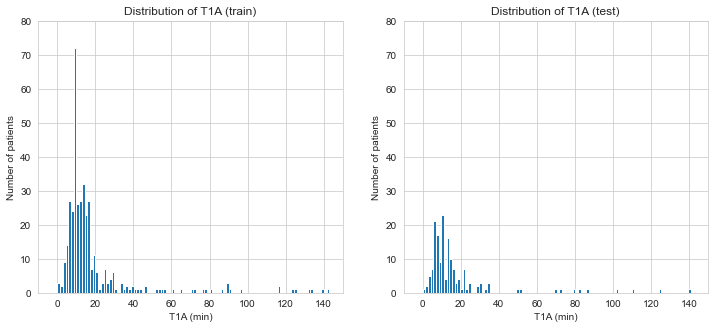

In [3]:
ratio = 0.3
random_seed = 42

train_df, validation_df = split_data(raw_df, ratio, random_seed, plot_distributions=True, verbose=True)

In [4]:
# To apply the MCCV, we need to split the training data using a relatively large number of random seeds
# We will use 100 random seeds
os.makedirs("models", exist_ok=True)

for random_seed in range(100, 200):
    train_df_, validation_df_ = split_data(raw_df, ratio, random_seed, plot_distributions=False, verbose=False)

    os.makedirs("models/{}".format(random_seed), exist_ok=True)

    train_df_.to_excel("models/{}/train_{}_ratio{}.xlsx".format(random_seed, random_seed, ratio), index=False)
    validation_df_.to_excel("models/{}/validation_{}_ratio{}.xlsx".format(random_seed, random_seed, ratio), index=False)

## Data preprocessing

Here we apply all preprocessing measure (mainly, min-max normalization over numerical features using only values form the training distribution). We also apply oversampling or feature selection if desired.

In [4]:
oversampling = False
feature_selection = False

preprocessed_data = preprocess_data(train_df, validation_df, oversampling, feature_selection)


Arterial framework for automated characterization of vascular tortuosity.
Copyright 2022 Stroke Research at Vall d'Hebron Research Institute (VHIR), Barcelona, Spain. 



The preprocessed_data is a dictionary containing the relevant training and validation information, already splitting the data into preprocessed features (X) for train and test, as well as the regression (y_reg) and classification labels (y_class). The dictionary containes the following keys:

In [6]:
print([key for key in preprocessed_data.keys()])

# The X_train and X_test should have 19 columns for the 19 features
preprocessed_data["X_train"].shape, preprocessed_data["X_test"].shape

['X_train', 'y_train_reg', 'y_train_class', 'X_test', 'y_test_reg', 'y_test_class']


((374, 19), (161, 19))

We can save the preprocessed data (both train and validation) using the pickle format. Let's preprocess the data for all the 100 random seeds.

In [7]:
for random_seed in range(100, 200):
    train_df_ = pd.read_excel("models/{}/train_{}_ratio{}.xlsx".format(random_seed, random_seed, ratio))
    validation_df_ = pd.read_excel("models/{}/validation_{}_ratio{}.xlsx".format(random_seed, random_seed, ratio))

    preprocessed_data_ = preprocess_data(train_df_, validation_df_, oversampling, feature_selection)

    save_pickle(preprocessed_data_, "models/{}/preprocessed_{}_ratio{}.pickle".format(random_seed, random_seed, ratio))

## Fitting a classification model

We have defined a series of functions to fit randomly initialized regression models for ultimate classification of the DTFA class. These are designed to input the the X_train, y_train, X_test and y_test from the preprocessed dictionary as well as the parameters for the regression `XGBRFRegressor` model. There is a function for fitting a single model, and a function to fit an ensemble of regressors. We chose to work with model ensembling following random initializations of the model. There was some small variability across random initializaiton seeds, but ensembling helped us reduce the vairability of these models and make overall models more robust. Functions for model fitting output a results summary dictionary with all the necessary data for model evaluation, saving the fitted models and predictions as well.

results_summary for xgb_reg-max_depth_2-n_estimators_100-subsample_0.2-seed_910-ensemble
Train: f1_score = 0.87, roc_auc = 0.79
Test: f1_score = 0.82, roc_auc = 0.73


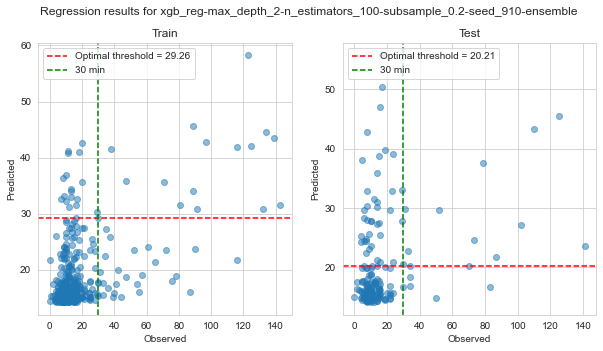

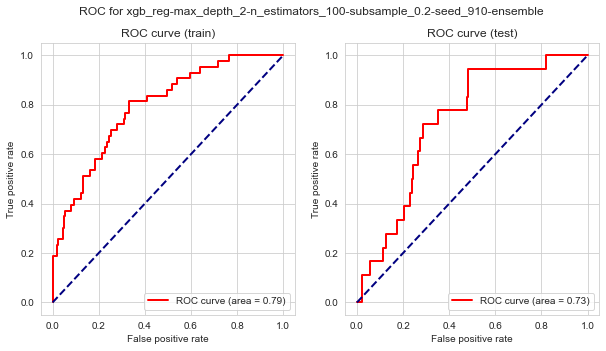

In [5]:
# Set necessary parameters
random_seed_initialization = 910
n_ensemble = 10

# We can set the parameters of the XGBoost RF Regressor model
params = {
    "max_depth": 2, 
    "n_estimators": 100, 
    "subsample": 0.2
}

X_train = preprocessed_data["X_train"]
y_train_reg = preprocessed_data["y_train_reg"]
y_train_class = preprocessed_data["y_train_class"]
X_test = preprocessed_data["X_test"]
y_test_reg = preprocessed_data["y_test_reg"]
y_test_class = preprocessed_data["y_test_class"]

model_name = get_model_name(params) + f"-seed_{random_seed_initialization}" + "-ensemble"
# Train the model and get predictions
summary = fit_reg_ensemble(X_train, y_train_reg, X_test, y_test_reg, params, random_seed_initialization, n_ensemble=n_ensemble)
# Evaluate train and validaiton performance of the model
summary = evaluate_model(model_name, summary, y_train_class, y_test_class, plot=True)

We can run the analysis for all MCCV splittings and assess the model's variability:

In [11]:
# Set necessary parameters
random_seed_initialization = 910
n_ensemble = 10

results_df = pd.DataFrame(columns=["Random seed (splitting)", "Train RMSE", "Test RMSE", "Train ROC", "Test ROC", "Train F1-score", "Test F1-score", "Test F1-score (train)"])

preprocessed_data_list = []
summary_list = []

for random_seed in range(100, 200):
    print("Random seed (splitting): ", random_seed)
    # load the preprocessing data
    preprocessed_data_ = load_pickle("models/{}/preprocessed_{}_ratio0.3.pickle".format(random_seed, random_seed))

    X_train = preprocessed_data_["X_train"]
    y_train_reg = preprocessed_data_["y_train_reg"]
    y_train_class = preprocessed_data_["y_train_class"]
    X_test = preprocessed_data_["X_test"]
    y_test_reg = preprocessed_data_["y_test_reg"]
    y_test_class = preprocessed_data_["y_test_class"]

    # We can set the parameters of the XGBoost RF Regressor model
    # We can  choose an average model to make a first inspection
    params = {
        "max_depth": 2, 
        "n_estimators": 100, 
        "subsample": 0.2
    }

    # Define model name
    model_name = get_model_name(params) + f"-seed_{random_seed_initialization}" + "-ensemble"
    # We can set an output directory for the model
    output_dir = "models/{}/results/{}".format(random_seed, model_name)
    os.makedirs(output_dir, exist_ok=True)
    if os.path.exists(f"{output_dir}/summary.pkl"):
        print("Loading summary from: ", f"{output_dir}/summary.pkl")
        summary_ = load_pickle(f"{output_dir}/summary.pkl")
    else:
        # Train the model and get predictions
        summary_ = fit_reg_ensemble(X_train, y_train_reg, X_test, y_test_reg, params, random_seed_initialization, n_ensemble=n_ensemble)
        # Evaluate train and validaiton performance of the model
        summary_ = evaluate_model(model_name, summary_, y_train_class, y_test_class, plot=False, output_dir=output_dir)
        # Save summary
        save_pickle(summary_, f"{output_dir}/summary.pkl")

    preprocessed_data_list.append(preprocessed_data_)
    summary_list.append(summary_)

    results_line = {"Random seed (splitting)": random_seed,
                    "Random seed (initialization)": random_seed_initialization,
                    "Train RMSE": summary_["rmse_train"],
                    "Test RMSE": summary_["rmse_test"],
                    "Train ROC": summary_["roc_auc_train"],
                    "Test ROC": summary_["roc_auc_test"],
                    "Train F1-score": summary_["f1_score_train"],
                    "Test F1-score": summary_["f1_score_test_train"],
                    "Test F1-score (train)": summary_["f1_score_test"]}

    # Concatenate results
    results_df = results_df.append(results_line, ignore_index=True)

# We can assess variability across random seeds for splitting
results_splitting = results_df.groupby("Random seed (initialization)").agg({"Train RMSE": ["mean", "std"],
                                                                            "Test RMSE": ["mean", "std"],
                                                                            "Train ROC": ["mean", "std"],
                                                                            "Test ROC": ["mean", "std"],
                                                                            "Train F1-score": ["mean", "std"],
                                                                            "Test F1-score": ["mean", "std"],
                                                                            "Test F1-score (train)": ["mean", "std"]})

display(results_splitting)

Random seed (splitting):  100
results_summary for xgb_reg-max_depth_2-n_estimators_100-subsample_0.2-seed_910-ensemble
Train: f1_score = 0.88, roc_auc = 0.83
Test: f1_score = 0.83, roc_auc = 0.62
Random seed (splitting):  101
results_summary for xgb_reg-max_depth_2-n_estimators_100-subsample_0.2-seed_910-ensemble
Train: f1_score = 0.86, roc_auc = 0.81
Test: f1_score = 0.81, roc_auc = 0.65
Random seed (splitting):  102
results_summary for xgb_reg-max_depth_2-n_estimators_100-subsample_0.2-seed_910-ensemble
Train: f1_score = 0.85, roc_auc = 0.79
Test: f1_score = 0.8, roc_auc = 0.69
Random seed (splitting):  103
results_summary for xgb_reg-max_depth_2-n_estimators_100-subsample_0.2-seed_910-ensemble
Train: f1_score = 0.85, roc_auc = 0.82
Test: f1_score = 0.79, roc_auc = 0.62
Random seed (splitting):  104
results_summary for xgb_reg-max_depth_2-n_estimators_100-subsample_0.2-seed_910-ensemble
Train: f1_score = 0.87, roc_auc = 0.82
Test: f1_score = 0.79, roc_auc = 0.61
Random seed (splittin

Train RMSE            Test RMSE            \
                                   mean       std       mean       std   
Random seed (initialization)                                             
910.0                         19.426972  0.619119  21.086911  1.491938   

                             Train ROC            Test ROC            \
                                  mean       std      mean       std   
Random seed (initialization)                                           
910.0                         0.797124  0.018148  0.678089  0.053401   

                             Train F1-score           Test F1-score            \
                                       mean       std          mean       std   
Random seed (initialization)                                                    
910.0                              0.853424  0.023907      0.809384  0.026376   

                             Test F1-score (train)            
                                              mean       std  
Random seed (initialization)                                  
910.0                                     0.781771  0.073381

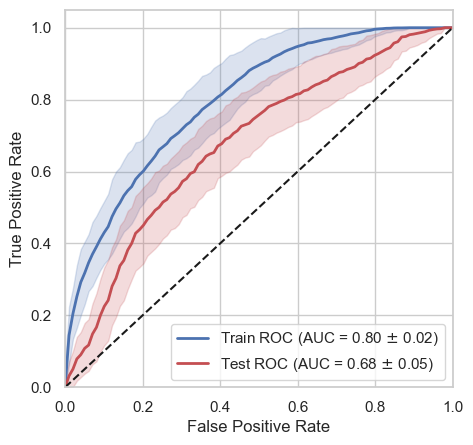

In [12]:
# Draw ROC curve for train and validation with variability
draw_roc_train_validation(preprocessed_data_list, summary_list)

## Fine-tuning

We defined 3 model hyperparameters for fine tuning. These were, with the bounds that were explored:
* `max_depth`: this parameter specifies the maximum depth of each tree in the ensemble. The depth of a tree is the maximum distance between the root (the very first decision node) and a leaf (a decision node with no further splits).. Values between 1 and 3 (included), with a step of 1, were tested.
* `n_estimators`: This parameter defines the number of trees in the forest. In XGBoost, this is akin to the number of boosting rounds. Values between 10 and 100 (included), with a step of 10, were tested.
* `subsample`: This parameter controls the fraction of the training data to be randomly sampled (without replacement) for each tree. Its value is between 0 and 1. This helps prevent overfitting. Values between 0.1 and 1.0 (included), with a step of 0.1, were tested.

A grid search was conducted based on these parameters. We can conduct a fine-tuning search for all the random seeds. Sit back, this may take a long while.

In [7]:
random_seed_initialization = 910

params_with_bounds = {
    "max_depth": (1, 4, 1),
    "n_estimators": (10, 100, 10),
    "subsample": (0.1, 1, 0.1)
}

for random_seed in range(100, 200):
    print("Running fine-tuning for random seed: ", random_seed)
    preprocessed_data = load_pickle("models/{}/preprocessed_{}_ratio0.3.pickle".format(random_seed, random_seed))
    if not os.path.exists("models/{}/results/results_fine_tuning.xlsx".format(random_seed)):
        run_fine_tuning(preprocessed_data, random_seed, random_seed_initialization, params_with_bounds)
    else:
        print("Fine-tuning already run for random seed: ", random_seed)

Running fine-tuning for random seed:  100
Fine-tuning already run for random seed:  100
Running fine-tuning for random seed:  101
Fine-tuning already run for random seed:  101
Running fine-tuning for random seed:  102
Fine-tuning already run for random seed:  102
Running fine-tuning for random seed:  103
Fine-tuning already run for random seed:  103
Running fine-tuning for random seed:  104
Fine-tuning already run for random seed:  104
Running fine-tuning for random seed:  105
Fine-tuning already run for random seed:  105
Running fine-tuning for random seed:  106
Fine-tuning already run for random seed:  106
Running fine-tuning for random seed:  107
Fine-tuning already run for random seed:  107
Running fine-tuning for random seed:  108
Fine-tuning already run for random seed:  108
Running fine-tuning for random seed:  109
Fine-tuning already run for random seed:  109
Running fine-tuning for random seed:  110
Fine-tuning already run for random seed:  110
Running fine-tuning for random s

In [8]:
best_model_name, best_params = choose_best_model(range(100, 200))

print("Best model name: ", best_model_name)

A total of 99 random seeds is taken into consideration for fine tuning
Best 10 models according to Mean Test ROC


,Model name,Mean Train RMSE,Mean Test RMSE,Mean Train ROC,Mean Test ROC,Mean Train F1-score,Mean Test F1-score (train),Std Train RMSE,Std Test RMSE,Std Train ROC,Std Test ROC,Std Train F1-score,Std Test F1-score (train)
72,xgb_reg-max_depth_1-n_estimators_90-subsample_...,20.681122,20.917832,0.758496,0.685950,0.830123,0.792212,0.608779,1.416900,0.019625,0.051783,0.024707,0.056983
57,xgb_reg-max_depth_1-n_estimators_70-subsample_...,20.535507,20.899519,0.759083,0.685862,0.826619,0.800726,0.598814,1.403595,0.020732,0.054687,0.030101,0.088781
39,xgb_reg-max_depth_1-n_estimators_50-subsample_...,20.537514,20.898972,0.758421,0.685862,0.827961,0.806357,0.597911,1.405657,0.020753,0.055910,0.031061,0.048582
66,xgb_reg-max_depth_1-n_estimators_80-subsample_...,20.536061,20.898663,0.759528,0.685619,0.828388,0.807480,0.597911,1.403604,0.020785,0.055662,0.028891,0.044323
48,xgb_reg-max_depth_1-n_estimators_60-subsample_...,20.535631,20.900204,0.758486,0.685609,0.824184,0.804586,0.598467,1.405294,0.020488,0.055168,0.030388,0.046690
75,xgb_reg-max_depth_1-n_estimators_90-subsample_...,20.535002,20.899985,0.759943,0.685531,0.829908,0.806307,0.596955,1.404415,0.020796,0.055255,0.030054,0.047452
74,xgb_reg-max_depth_1-n_estimators_90-subsample_...,20.544211,20.927770,0.760346,0.685450,0.828324,0.797380,0.597053,1.416144,0.020353,0.053105,0.028786,0.048409
65,xgb_reg-max_depth_1-n_estimators_80-subsample_...,20.545100,20.925847,0.760192,0.685403,0.826747,0.798244,0.597286,1.414916,0.020201,0.053079,0.027033,0.047240
54,xgb_reg-max_depth_1-n_estimators_70-subsample_...,20.683120,20.922258,0.757394,0.685397,0.831472,0.793686,0.611565,1.417853,0.019581,0.051945,0.025772,0.056966
63,xgb_reg-max_depth_1-n_estimators_80-subsample_...,20.682380,20.920632,0.757758,0.685360,0.828470,0.794047,0.610147,1.417368,0.020054,0.052548,0.028821,0.056614


Best model was: xgb_reg-max_depth_1-n_estimators_90-subsample_0.1-seed_910-ensemble
Best model name:  xgb_reg-max_depth_1-n_estimators_90-subsample_0.1-seed_910-ensemble


We can repeat the assessment for variability with the best model from fine-tuning:

In [9]:
# Set necessary parameters
random_seed_initialization = 910
n_ensemble = 10

results_df = pd.DataFrame(columns=["Random seed (splitting)", "Train RMSE", "Test RMSE", "Train ROC", "Test ROC", "Train F1-score", "Test F1-score", "Test F1-score (train)"])

preprocessed_data_list = []
summary_list = []

for random_seed in range(100, 200):
    print("Random seed (splitting): ", random_seed)
    # load the preprocessing data
    preprocessed_data_ = load_pickle("models/{}/preprocessed_{}_ratio0.3.pickle".format(random_seed, random_seed))

    X_train = preprocessed_data_["X_train"]
    y_train_reg = preprocessed_data_["y_train_reg"]
    y_train_class = preprocessed_data_["y_train_class"]
    X_test = preprocessed_data_["X_test"]
    y_test_reg = preprocessed_data_["y_test_reg"]
    y_test_class = preprocessed_data_["y_test_class"]

    # We can set the parameters of the XGBoost RF Regressor model
    params =  best_params.copy()

    # Define model name
    model_name = get_model_name(params) + f"-seed_{random_seed_initialization}" + "-ensemble"
    # We can set an output directory for the model
    output_dir = "models/{}/results/{}".format(random_seed, model_name)
    os.makedirs(output_dir, exist_ok=True)
    if os.path.exists(f"{output_dir}/summary.pkl"):
        print("Loading summary from: ", f"{output_dir}/summary.pkl")
        summary_ = load_pickle(f"{output_dir}/summary.pkl")
    else:
        # Train the model and get predictions
        summary_ = fit_reg_ensemble(X_train, y_train_reg, X_test, y_test_reg, params, random_seed_initialization, n_ensemble=n_ensemble)
        # Evaluate train and validaiton performance of the model
        summary_ = evaluate_model(model_name, summary_, y_train_class, y_test_class, plot=False, output_dir=output_dir)
        # Save summary
        save_pickle(summary_, f"{output_dir}/summary.pkl")

    preprocessed_data_list.append(preprocessed_data_)
    summary_list.append(summary_)

    results_line = {"Random seed (splitting)": random_seed,
                    "Random seed (initialization)": random_seed_initialization,
                    "Train RMSE": summary_["rmse_train"],
                    "Test RMSE": summary_["rmse_test"],
                    "Train ROC": summary_["roc_auc_train"],
                    "Test ROC": summary_["roc_auc_test"],
                    "Train F1-score": summary_["f1_score_train"],
                    "Test F1-score": summary_["f1_score_test_train"],
                    "Test F1-score (train)": summary_["f1_score_test"]}

    # Concatenate results
    results_df = results_df.append(results_line, ignore_index=True)

# We can assess variability across random seeds for splitting
results_splitting = results_df.groupby("Random seed (initialization)").agg({"Train RMSE": ["mean", "std"],
                                                                            "Test RMSE": ["mean", "std"],
                                                                            "Train ROC": ["mean", "std"],
                                                                            "Test ROC": ["mean", "std"],
                                                                            "Train F1-score": ["mean", "std"],
                                                                            "Test F1-score": ["mean", "std"],
                                                                            "Test F1-score (train)": ["mean", "std"]})

display(results_splitting)

Random seed (splitting):  100
results_summary for xgb_reg-max_depth_1-n_estimators_90-subsample_0.1-seed_910-ensemble
Train: f1_score = 0.86, roc_auc = 0.77
Test: f1_score = 0.82, roc_auc = 0.63
Random seed (splitting):  101
results_summary for xgb_reg-max_depth_1-n_estimators_90-subsample_0.1-seed_910-ensemble
Train: f1_score = 0.83, roc_auc = 0.78
Test: f1_score = 0.79, roc_auc = 0.66
Random seed (splitting):  102
results_summary for xgb_reg-max_depth_1-n_estimators_90-subsample_0.1-seed_910-ensemble
Train: f1_score = 0.84, roc_auc = 0.75
Test: f1_score = 0.79, roc_auc = 0.71
Random seed (splitting):  103
results_summary for xgb_reg-max_depth_1-n_estimators_90-subsample_0.1-seed_910-ensemble
Train: f1_score = 0.81, roc_auc = 0.77
Test: f1_score = 0.76, roc_auc = 0.62
Random seed (splitting):  104
results_summary for xgb_reg-max_depth_1-n_estimators_90-subsample_0.1-seed_910-ensemble
Train: f1_score = 0.83, roc_auc = 0.79
Test: f1_score = 0.83, roc_auc = 0.61
Random seed (splitting): 

Train RMSE            Test RMSE            \
                                   mean       std       mean       std   
Random seed (initialization)                                             
910.0                         20.670577  0.617846  20.943557  1.440064   

                             Train ROC            Test ROC           \
                                  mean       std      mean      std   
Random seed (initialization)                                          
910.0                         0.758663  0.019697  0.685688  0.05185   

                             Train F1-score           Test F1-score            \
                                       mean       std          mean       std   
Random seed (initialization)                                                    
910.0                              0.830304  0.024773      0.801645  0.030879   

                             Test F1-score (train)            
                                              mean       std  
Random seed (initialization)                                  
910.0                                     0.792244  0.056984

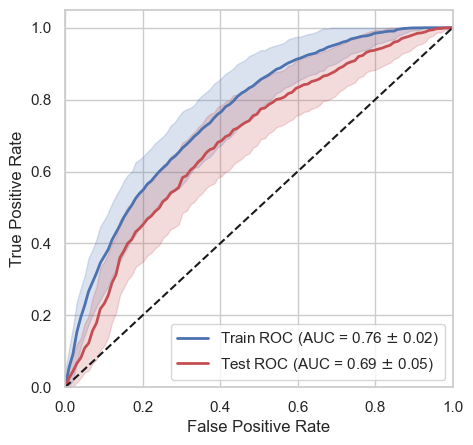

In [11]:
# Draw ROC curve for train and validation with variability
draw_roc_train_validation(preprocessed_data_list, summary_list)

## Feature selection analysis

In order to improve the performance of the model, we can conduct a feature selection analysis. We will use SHAP values for the feature importance analysis. Unfortunately, the TreeExplainer from the shap library does not work with the XGBRFRegressor by default. We will be using an XGBRegressor as a proxy model. in our internal analysis, the XGBRegressor could achieve results close to those obtained by the XGBRFRegressor, but it overfit very rapidly, preventing us to experiment with the parameters of the model as we can with the XBGRFRegressor. We conducted a full hyperparameter grid search, but we could not get the same results as with the XGBRFRegressor. If you want to give it a try, you can just switch the model in the regressors_utils.py script and everything else will work just fine. For our feature importance analysis, we will be using the XGBRegressor with the following parameters:
* max_depth = 1
* n_estimators = 10
* subsample = 0.1

These are very aggressive parameters, but performance, as we will see, is not far from that obtaied with the current setting. By using the XGBRegressor, we can simply use the Explainer in the shap library and perform the feature importance analysis.

We will be fitting ans testing all the 100 splittings from the MCCV and average the SHAP values obtained for the validation samples of each splitting. Results are pretty consistent across models, which gives us confidence of the true meaning of the features.

In [7]:
random_seed_initialization = 917
params = {
    "max_depth": 1,
    "n_estimators": 60,
    "subsample": 0.5
}

shap_values_monte_carlo = pd.DataFrame(columns=["Feature", "Mean abs SHAP", "Std abs SHAP", "RS Splitting"])

for random_seed in range(100, 200):
    preprocessed_data = load_pickle("models/{}/preprocessed_{}_ratio0.3.pickle".format(random_seed, random_seed))

    shap_values_ensemble_abs_mean_std = get_shap_values_ensemble(preprocessed_data, params, random_seed_initialization)
    shap_values_ensemble_abs_mean_std["RS Splitting"] = random_seed

    shap_values_monte_carlo = pd.concat([shap_values_monte_carlo, shap_values_ensemble_abs_mean_std], ignore_index=True)

Text(0.5, 1.0, 'Feature importance (SHAP values)')

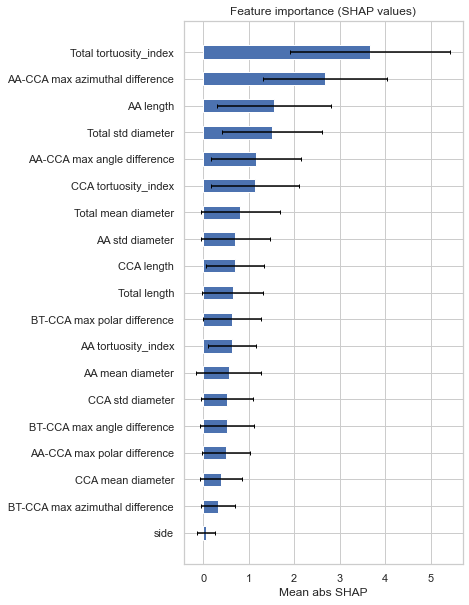

In [5]:
# Average across random seeds
shap_values_monte_carlo_mean_average = shap_values_monte_carlo.groupby("Feature").mean().reset_index().drop(columns=["RS Splitting"])
shap_values_monte_carlo_mean_std = shap_values_monte_carlo.groupby("Feature").std().reset_index().drop(columns=["RS Splitting"])
# Sort by Mean abs SHAP
shap_values_monte_carlo_mean_average.sort_values(by="Mean abs SHAP", ascending=True, inplace=True)
shap_values_monte_carlo_mean_average["Std abs SHAP"] = shap_values_monte_carlo_mean_std["Mean abs SHAP"]
display(shap_values_monte_carlo_mean_average)

features = shap_values_monte_carlo_mean_average["Feature"]
mean_abs_shap = shap_values_monte_carlo_mean_average["Mean abs SHAP"]
std_abs_shap = shap_values_monte_carlo_mean_average["Std abs SHAP"]

# Create the figure and a bar plot
fig, ax = plt.subplots(figsize=(5, 10))
ax.barh(features, mean_abs_shap, xerr=std_abs_shap * 2, height=0.5, alpha=1.0, ecolor='black', capsize=2)  
ax.set_xlabel("Mean abs SHAP")
ax.set_title("Feature importance (SHAP values)")

In [13]:
# Show SHAP values below 0.5
display(shap_values_monte_carlo_mean_average[shap_values_monte_carlo_mean_average["Mean abs SHAP"] < 1])
print("Features included in the analysis:")
important_features = shap_values_monte_carlo_mean_average[shap_values_monte_carlo_mean_average["Mean abs SHAP"] >= 1]["Feature"].values
print(important_features)

,Feature,Mean abs SHAP,Std abs SHAP
18,side,0.045163,0.086320
8,BT-CCA max azimuthal difference,0.342834,0.227197
11,CCA mean diameter,0.394717,0.227972
6,AA-CCA max polar difference,0.493275,0.259305
7,BT-CCA max angle difference,0.524141,0.306896
12,CCA std diameter,0.530843,0.289713
1,AA mean diameter,0.578883,0.360976
9,BT-CCA max polar difference,0.630231,0.354565
14,Total length,0.630803,0.324484
3,AA tortuosity_index,0.660977,0.322071


Features included in the analysis:
['CCA tortuosity_index' 'AA-CCA max angle difference' 'Total std diameter'
 'AA length' 'AA-CCA max azimuthal difference' 'Total tortuosity_index']


## Run fine-tuning with new feature set

In [1]:
random_seed_initialization = 911

params_with_bounds = {
    "max_depth": (1, 4, 1),
    "n_estimators": (10, 110, 10),
    "subsample": (0.1, 1.1, 0.1)
}

important_features = ['CCA tortuosity_index', 'AA-CCA max angle difference', 'Total std diameter',
                      'AA length', 'AA-CCA max azimuthal difference', 'Total tortuosity_index']

for random_seed in range(100, 200):
    print("Running fine-tuning for random seed: ", random_seed)
    preprocessed_data = load_pickle("data/splits/{}/preprocessed_{}_ratio0.3.pickle".format(random_seed, random_seed))
    if not os.path.exists("models/{}/results/results_fine_tuning_important_features.xlsx".format(random_seed)):
        run_fine_tuning(preprocessed_data, random_seed, random_seed_initialization, params_with_bounds,
                        important_features=important_features, flag="important_features")
    else:
        print("Fine-tuning already run for random seed: ", random_seed)


Arterial framework for automated characterization of vascular tortuosity.
Copyright 2022 Stroke Research at Vall d'Hebron Research Institute (VHIR), Barcelona, Spain. 

Running fine-tuning for random seed:  100
Fine-tuning already run for random seed:  100
Running fine-tuning for random seed:  101
Fine-tuning already run for random seed:  101
Running fine-tuning for random seed:  102
results_summary for xgb_reg-max_depth_1-n_estimators_10-subsample_0.1-seed_911-ensemble
Train: f1_score = 0.78, roc_auc = 0.75
Test: f1_score = 0.71, roc_auc = 0.76
results_summary for xgb_reg-max_depth_1-n_estimators_10-subsample_0.2-seed_911-ensemble
Train: f1_score = 0.83, roc_auc = 0.76
Test: f1_score = 0.82, roc_auc = 0.7
results_summary for xgb_reg-max_depth_1-n_estimators_10-subsample_0.3-seed_911-ensemble
Train: f1_score = 0.85, roc_auc = 0.76
Test: f1_score = 0.8, roc_auc = 0.67
results_summary for xgb_reg-max_depth_1-n_estimators_10-subsample_0.4-seed_911-ensemble
Train: f1_score = 0.82, roc_auc

In [1]:
best_model_name, best_params = choose_best_model(range(100, 200), flag="important_features")

print("Best model name: ", best_model_name)


Arterial framework for automated characterization of vascular tortuosity.
Copyright 2022 Stroke Research at Vall d'Hebron Research Institute (VHIR), Barcelona, Spain. 

A total of 100 random seeds is taken into consideration for fine tuning
Best 10 models according to Mean Test ROC


,Model name,Mean Train RMSE,Mean Test RMSE,Mean Train ROC,Mean Test ROC,Mean Train F1-score,Mean Test F1-score (train),Std Train RMSE,Std Test RMSE,Std Train ROC,Std Test ROC,Std Train F1-score,Std Test F1-score (train)
40,xgb_reg-max_depth_1-n_estimators_50-subsample_...,20.576284,20.619436,0.762805,0.714411,0.807845,0.802366,0.617637,1.450073,0.020845,0.054609,0.039201,0.052733
20,xgb_reg-max_depth_1-n_estimators_30-subsample_...,20.589337,20.615678,0.762413,0.714194,0.810737,0.804593,0.615850,1.459781,0.020833,0.054225,0.037817,0.052811
30,xgb_reg-max_depth_1-n_estimators_40-subsample_...,20.580749,20.622639,0.762555,0.713899,0.808582,0.799987,0.616883,1.454814,0.021189,0.055067,0.039439,0.066819
10,xgb_reg-max_depth_1-n_estimators_20-subsample_...,20.580344,20.618523,0.760889,0.713077,0.808516,0.805179,0.615413,1.458345,0.021354,0.054447,0.036153,0.057082
0,xgb_reg-max_depth_1-n_estimators_10-subsample_...,20.599690,20.641571,0.758192,0.708619,0.812269,0.804359,0.623393,1.468844,0.022681,0.059318,0.031546,0.064924
21,xgb_reg-max_depth_1-n_estimators_30-subsample_...,20.560744,20.740135,0.760135,0.705202,0.815066,0.802234,0.609728,1.449589,0.019686,0.051470,0.032117,0.060691
31,xgb_reg-max_depth_1-n_estimators_40-subsample_...,20.555126,20.745321,0.760402,0.705019,0.816366,0.798726,0.611222,1.445423,0.020002,0.052020,0.036627,0.061916
11,xgb_reg-max_depth_1-n_estimators_20-subsample_...,20.555419,20.742603,0.758817,0.703421,0.814815,0.802620,0.607387,1.457172,0.020941,0.051577,0.030378,0.062105
1,xgb_reg-max_depth_1-n_estimators_10-subsample_...,20.568758,20.759921,0.754643,0.700643,0.814679,0.800118,0.610936,1.476439,0.022358,0.056243,0.030425,0.063285
32,xgb_reg-max_depth_1-n_estimators_40-subsample_...,20.556981,20.780411,0.756352,0.698388,0.822020,0.805075,0.606327,1.439684,0.020363,0.051346,0.030465,0.059759


Best model was: xgb_reg-max_depth_1-n_estimators_50-subsample_0.1-seed_910-ensemble
Best model name:  xgb_reg-max_depth_1-n_estimators_50-subsample_0.1-seed_910-ensemble


We can again assess variability of the best model configuration.

In [3]:
# Set necessary parameters
random_seed_initialization = 920
n_ensemble = 10

results_df = pd.DataFrame(columns=["Random seed (splitting)", "Train RMSE", "Test RMSE", "Train ROC", "Test ROC", "Train F1-score", "Test F1-score", "Test F1-score (train)"])

preprocessed_data_list = []
summary_list = []

important_features = ['CCA tortuosity_index', 'AA-CCA max angle difference', 'Total std diameter',
                        'AA length', 'AA-CCA max azimuthal difference', 'Total tortuosity_index']

best_params = {
    "max_depth": 1,
    "n_estimators": 50,
    "subsample": 0.1
}

for random_seed in range(100, 200):
    print("Random seed (splitting): ", random_seed)
    # load the preprocessing data
    preprocessed_data_ = load_pickle("models/{}/preprocessed_{}_ratio0.3.pickle".format(random_seed, random_seed))

    X_train = preprocessed_data_["X_train"]
    y_train_reg = preprocessed_data_["y_train_reg"]
    y_train_class = preprocessed_data_["y_train_class"]
    X_test = preprocessed_data_["X_test"]
    y_test_reg = preprocessed_data_["y_test_reg"]
    y_test_class = preprocessed_data_["y_test_class"]

    if important_features is not None:
        X_train = X_train[important_features]
        X_test = X_test[important_features]

    # We can set the parameters of the XGBoost RF Regressor model
    params = best_params.copy()

    # Define model name
    model_name = get_model_name(params) + f"-seed_{random_seed_initialization}" + "-ensemble"
    # We can set an output directory for the model
    output_dir = "models/{}/results/{}".format(random_seed, model_name)
    os.makedirs(output_dir, exist_ok=True)
    if os.path.exists(f"{output_dir}/summary.pkl"):
        print("Loading summary from: ", f"{output_dir}/summary.pkl")
        summary_ = load_pickle(f"{output_dir}/summary.pkl")
    else:
        # Train the model and get predictions
        summary_ = fit_reg_ensemble(X_train, y_train_reg, X_test, y_test_reg, params, random_seed_initialization, n_ensemble=n_ensemble)
        # Evaluate train and validaiton performance of the model
        summary_ = evaluate_model(model_name, summary_, y_train_class, y_test_class, plot=True, output_dir=output_dir)
        # Save summary
        save_pickle(summary_, f"{output_dir}/summary.pkl")

    preprocessed_data_list.append(preprocessed_data_)
    summary_list.append(summary_)

    results_line = {"Random seed (splitting)": random_seed,
                    "Random seed (initialization)": random_seed_initialization,
                    "Train RMSE": summary_["rmse_train"],
                    "Test RMSE": summary_["rmse_test"],
                    "Train ROC": summary_["roc_auc_train"],
                    "Test ROC": summary_["roc_auc_test"],
                    "Train F1-score": summary_["f1_score_train"],
                    "Test F1-score": summary_["f1_score_test_train"],
                    "Test F1-score (train)": summary_["f1_score_test"]}

    # Concatenate results
    results_df = results_df.append(results_line, ignore_index=True)

# We can assess variability across random seeds for splitting
results_splitting = results_df.groupby("Random seed (initialization)").agg({"Train RMSE": ["mean", "std"],
                                                                            "Test RMSE": ["mean", "std"],
                                                                            "Train ROC": ["mean", "std"],
                                                                            "Test ROC": ["mean", "std"],
                                                                            "Train F1-score": ["mean", "std"],
                                                                            "Test F1-score": ["mean", "std"],
                                                                            "Test F1-score (train)": ["mean", "std"]})

display(results_splitting)

Random seed (splitting):  100
Loading summary from:  data/splits/100/results/xgb_reg-max_depth_1-n_estimators_50-subsample_0.1-seed_920-ensemble/summary.pkl
Random seed (splitting):  101
Loading summary from:  data/splits/101/results/xgb_reg-max_depth_1-n_estimators_50-subsample_0.1-seed_920-ensemble/summary.pkl
Random seed (splitting):  102
Loading summary from:  data/splits/102/results/xgb_reg-max_depth_1-n_estimators_50-subsample_0.1-seed_920-ensemble/summary.pkl
Random seed (splitting):  103
Loading summary from:  data/splits/103/results/xgb_reg-max_depth_1-n_estimators_50-subsample_0.1-seed_920-ensemble/summary.pkl
Random seed (splitting):  104
Loading summary from:  data/splits/104/results/xgb_reg-max_depth_1-n_estimators_50-subsample_0.1-seed_920-ensemble/summary.pkl
Random seed (splitting):  105
Loading summary from:  data/splits/105/results/xgb_reg-max_depth_1-n_estimators_50-subsample_0.1-seed_920-ensemble/summary.pkl
Random seed (splitting):  106
Loading summary from:  data/

Train RMSE            Test RMSE            \
                                   mean       std       mean       std   
Random seed (initialization)                                             
920.0                         20.591425  0.611936  20.624751  1.446061   

                             Train ROC            Test ROC            \
                                  mean       std      mean       std   
Random seed (initialization)                                           
920.0                         0.761747  0.020088  0.714495  0.053715   

                             Train F1-score           Test F1-score            \
                                       mean       std          mean       std   
Random seed (initialization)                                                    
920.0                              0.810066  0.037826      0.786321  0.037873   

                             Test F1-score (train)            
                                              mean       std  
Random seed (initialization)                                  
920.0                                     0.803161  0.061981

Weighted precision: 0.87 ± 0.01
Weighted recall: 0.77 ± 0.08
Weighted F1-score: 0.80 ± 0.06
Sensitivity: 0.59 ± 0.15
Specificity: 0.80 ± 0.11
F1-score: 0.37 ± 0.06
FPR: 0.20 ± 0.11
FNR: 0.41 ± 0.15
NPV: 0.94 ± 0.02
PPV: 0.29 ± 0.08
Cohen's kappa: 0.26 ± 0.08
Matthews correlation coefficient: 0.30 ± 0.07


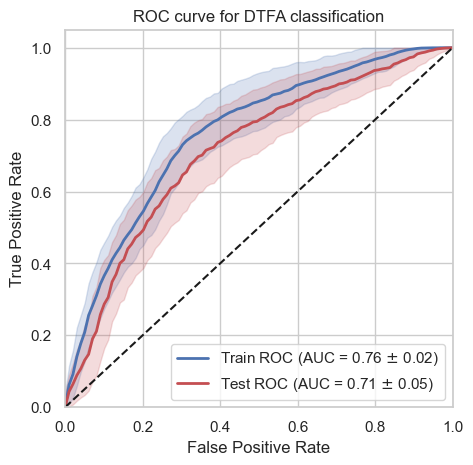

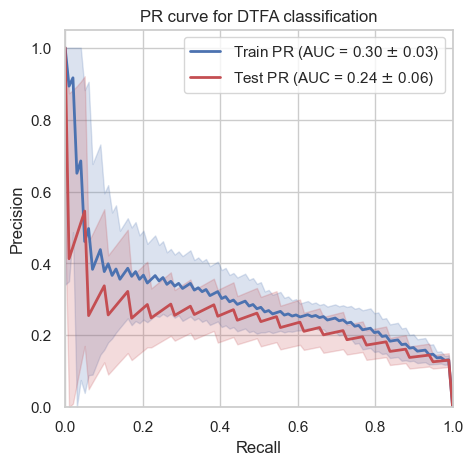

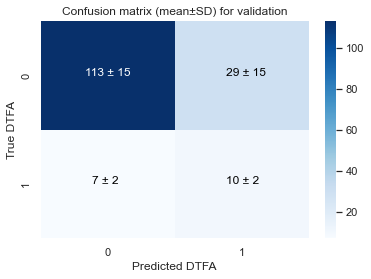

In [4]:
# Draw ROC curve for train and validation with variability
draw_roc_train_validation(preprocessed_data_list, summary_list)

Great! We managed to improve the classification metrics of the model and reduce overfitting (the gap between train and test curves). Even though it is not directly the same model, we can assess feature importance again.

In [29]:
random_seed_initialization = 920

params = {
    "max_depth": 1,
    "n_estimators": 60,
    "subsample": 0.5
}

shap_values_monte_carlo = pd.DataFrame(columns=["Feature", "Mean abs SHAP", "Std abs SHAP", "RS Splitting"])

important_features = ['CCA tortuosity_index', 'AA-CCA max angle difference', 'Total std diameter',
                        'AA length', 'AA-CCA max azimuthal difference', 'Total tortuosity_index']

for random_seed in range(100, 200):
    preprocessed_data_ = load_pickle("models/{}/preprocessed_{}_ratio0.3.pickle".format(random_seed, random_seed))

    if important_features is not None:
        preprocessed_data_["X_train"] = preprocessed_data_["X_train"][important_features]
        preprocessed_data_["X_test"] = preprocessed_data_["X_test"][important_features]

    shap_values_ensemble_abs_mean_std = get_shap_values_ensemble(preprocessed_data_, params, random_seed_initialization)
    shap_values_ensemble_abs_mean_std["RS Splitting"] = random_seed

    shap_values_monte_carlo = pd.concat([shap_values_monte_carlo, shap_values_ensemble_abs_mean_std], ignore_index=True)

,Feature,Mean abs SHAP,Std abs SHAP
3,CCA tortuosity_index,1.495635,0.534269
1,AA-CCA max angle difference,1.576028,0.476777
4,Total std diameter,1.767292,0.543238
0,AA length,2.051582,0.563478
2,AA-CCA max azimuthal difference,2.858937,0.673125
5,Total tortuosity_index,3.575196,0.812991


Text(0.5, 1.0, 'Feature importance (SHAP values)')

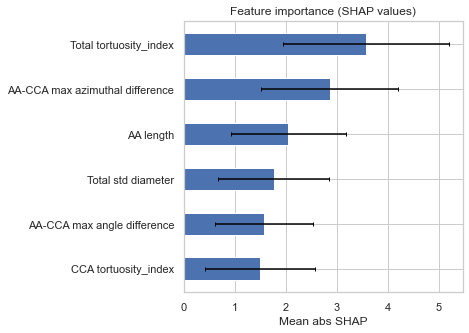

In [30]:
# Average across random seeds
shap_values_monte_carlo_mean_average = shap_values_monte_carlo.groupby("Feature").mean().reset_index().drop(columns=["RS Splitting"])
shap_values_monte_carlo_mean_std = shap_values_monte_carlo.groupby("Feature").std().reset_index().drop(columns=["RS Splitting"])
# Sort by Mean abs SHAP
shap_values_monte_carlo_mean_average.sort_values(by="Mean abs SHAP", ascending=True, inplace=True)
shap_values_monte_carlo_mean_average["Std abs SHAP"] = shap_values_monte_carlo_mean_std["Mean abs SHAP"]
display(shap_values_monte_carlo_mean_average)

import matplotlib.pyplot as plt
import seaborn as sns

# Use Seaborn for better aesthetics
sns.set(style="whitegrid")

# Data
features = shap_values_monte_carlo_mean_average["Feature"]
mean_abs_shap = shap_values_monte_carlo_mean_average["Mean abs SHAP"]
std_abs_shap = shap_values_monte_carlo_mean_average["Std abs SHAP"]

# Create the figure and a bar plot
fig, ax = plt.subplots(figsize=(5, 5))
ax.barh(features, mean_abs_shap, xerr=std_abs_shap * 2, height=0.5, alpha=1.0, ecolor='black', capsize=2)  
ax.set_xlabel("Mean abs SHAP")
ax.set_title("Feature importance (SHAP values)")

The feature importance profile is very similar to that found with the larger group of the model, which can be seen as a sign of robustness of the model. However, by reducing the amount of confounding descriptors we managed to improve the validation metrics and reduce overfitting of the model overall.

## Feature importance analysis

Even though the implemented XGBRFRegressor does not have support for SHAP value extraction, we can take a look at the feature importance in the random forest trees in terms of "gain", which (ChatGPT) "represents the average gain of a feature when it is used in trees within the model. In simpler terms, it indicates how much using a particular feature improves the performance of the model, specifically by how much it reduces the model's error or loss. A higher value for a feature's gain means it is more important for making predictions."

In [7]:
random_seed_initialization = 920

params = {
    "max_depth": 1,
    "n_estimators": 60,
    "subsample": 0.5
}

feature_importance_monte_carlo = pd.DataFrame(columns=["Feature", "Mean feature importance", "Std feature importance", "RS Splitting"])

important_features = ['CCA tortuosity_index', 'AA-CCA max angle difference', 'Total std diameter',
                        'AA length', 'AA-CCA max azimuthal difference', 'Total tortuosity_index']
important_features_ = ['CCA tortuosity index', 'AA-CCA max angle difference', 'Total std diameter',
                        'AA length', 'AA-CCA max azimuthal difference', 'Total tortuosity index']

for random_seed in range(100, 200):
    idx = random_seed - 100
    summary = summary_list[idx]

    feature_importance_ensemble_abs_mean_std = get_feature_importance(summary["model"], important_features)
    feature_importance_ensemble_abs_mean_std["RS Splitting"] = random_seed

    feature_importance_monte_carlo = pd.concat([feature_importance_monte_carlo, feature_importance_ensemble_abs_mean_std], ignore_index=True)

feature_importance_monte_carlo["Mean feature importance"] = feature_importance_monte_carlo["Mean feature importance"].astype(float)
feature_importance_monte_carlo["Std feature importance"] = feature_importance_monte_carlo["Std feature importance"].astype(float)
feature_importance_monte_carlo["RS Splitting"] = feature_importance_monte_carlo["RS Splitting"].astype(int)


,Feature,Mean feature importance,Std feature importance
0,AA length,0.114622,0.019783
1,AA-CCA max angle difference,0.145169,0.021223
4,Total std diameter,0.158210,0.039552
2,AA-CCA max azimuthal difference,0.176776,0.019549
3,CCA tortuosity_index,0.188909,0.026604
5,Total tortuosity_index,0.216314,0.028736


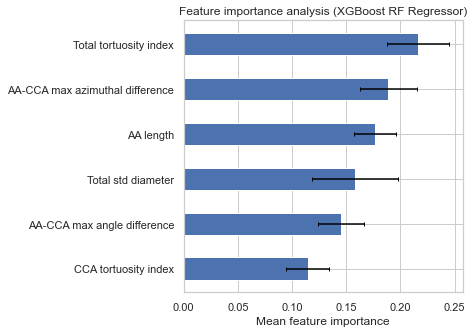

In [9]:
# Average across random seeds
feature_importance_monte_carlo_mean_average = feature_importance_monte_carlo.groupby("Feature").mean().reset_index().drop(columns=["RS Splitting"])
feature_importance_monte_carlo_mean_std = feature_importance_monte_carlo.groupby("Feature").std().reset_index().drop(columns=["RS Splitting"])
# Sort by Mean abs SHAP
feature_importance_monte_carlo_mean_average.sort_values(by="Mean feature importance", ascending=True, inplace=True)
feature_importance_monte_carlo_mean_average["Std feature importance"] = feature_importance_monte_carlo_mean_std["Mean feature importance"]
display(feature_importance_monte_carlo_mean_average)

features = important_features_
mean_feature_importance = feature_importance_monte_carlo_mean_average["Mean feature importance"]
std_feature_importance = feature_importance_monte_carlo_mean_average["Std feature importance"]

# Create the figure and a bar plot
fig, ax = plt.subplots(figsize=(5, 5))
ax.barh(features, mean_feature_importance, xerr=std_feature_importance, height=0.5, alpha=1.0, ecolor='black', capsize=2)  
ax.set_title("Feature importance analysis (XGBoost RF Regressor)")
ax.set_xlabel("Mean feature importance")